# At the beginning of your notebook

In [1]:
# confirm environment name
!conda info --envs

# conda environments:
#
base                     /Users/val/opt/anaconda3
microscopeProject     *  /Users/val/opt/anaconda3/envs/microscopeProject



In [2]:
#!pip install fsspec gcsfs

#from google.colab import auth
#auth.authenticate_user()

In [3]:
import tensorflow.keras as keras

In [4]:
# make sure you have two magic functions imported at the beginning of your notebook
%load_ext autoreload
%autoreload 2



As you have probably noticed (or calculated), there is no way how to get all the dataset into the RAM given the 16 GB of Kaggle Kernels (for float32 representation of inputs, you would need around 128 GB of RAM just for training dataset itself, if my calculations are correct).

In [5]:
import tensorflow as tf
tf.__version__

'2.4.1'

In [6]:
# Enable MLIR Graph Optimizations
tf.config.experimental.enable_mlir_graph_optimization()

In [7]:
import sys
import numpy as np

oneImage8 = np.zeros((1, 512, 512, 4), dtype=np.int8)
oneImage16 = np.zeros((1, 512, 512, 4), dtype=np.float16)
oneImage32 = np.zeros((1, 512, 512, 4), dtype=np.float32)
print('Size of all training images, if encoded as int8: ', sys.getsizeof(oneImage8) * 31072 / 1024 / 1024 / 1024, ' GB')
print('Size of all training images, if encoded as float16: ', sys.getsizeof(oneImage16) * 31072 / 1024 / 1024 / 1024, ' GB')
print('Size of all training images, if encoded as float32: ', sys.getsizeof(oneImage32) * 31072 / 1024 / 1024 / 1024, ' GB')

Size of all training images, if encoded as int8:  30.347917079925537  GB
Size of all training images, if encoded as float16:  60.69166707992554  GB
Size of all training images, if encoded as float32:  121.37916707992554  GB


This kernel tries to play around with custom data generator for fast on-fly data loading. It's written as a descendant of **keras.utils.Sequence**, which has the nice property to be compatible with the **use_multiprocessing=True** setting in *model.fit_generator()* function.

Now with added caching: If you have enough RAM (e.g. running this script on Google Cloud highmem VC), you can let the Data Generator save all the data into RAM and then use these in the following epochs. Do not try this on Kaggle Kernels with full training dataset, though.
Currently, using cache cannot be combined with **use_multiprocessing=True** because this parameter leads to creating multiple DataGenerator objects that do not have any shared variables. Solutions to this are welcome.

In [8]:
#import tensorflow.keras as keras
from tensorflow.keras.utils import Sequence
from PIL import Image
from matplotlib import pyplot as plt
import pandas as pd
from tqdm import tqdm
import os

In [9]:
BATCH_SIZE = 16
SEED = 777
SHAPE = (512, 512, 4)
DIR = '../data/raw/human-protein-atlas-image-classification symlink'
BUCKET="drive3"

#DIR = f"gs://{BUCKET}/data/human-protein-atlas-image-classification"
VAL_RATIO = 0.1 # 10 % as validation
DEBUG = True
THRESHOLD = np.float64(0.05) # due to different cost of True Positive vs False Positive, this is the probability threshold to predict the class as 'yes'

In [10]:
import os


def getTrainDataset():
    
    path_to_train = DIR + '/train/'
    data = pd.read_csv(DIR+'/train.csv')

    paths = []
    labels = []
    
    for name, lbl in zip(data['Id'], data['Target'].str.split(' ')):
        y = np.zeros(28)
        for key in lbl:
            y[int(key)] = 1
        paths.append(os.path.join(path_to_train, name))
        labels.append(y)

    return np.array(paths), np.array(labels)

def getTestDataset():
    
    path_to_test = DIR + '/test/'
    data = pd.read_csv(DIR+'/sample_submission.csv')

    paths = []
    labels = []
    
    for name in data['Id']:
        y = np.ones(28)
        paths.append(os.path.join(path_to_test, name))
        labels.append(y)

    return np.array(paths), np.array(labels)


In [11]:
# credits: https://github.com/keras-team/keras/blob/master/keras/utils/data_utils.py#L302
# credits: https://stanford.edu/~shervine/blog/keras-how-to-generate-data-on-the-fly

from google.cloud import storage   
from urllib.parse import urlparse
import io




        
class ProteinDataGenerator(keras.utils.Sequence):
            
    def __init__(self, paths, labels, batch_size, shape, shuffle = False, use_cache = False):
        self.paths, self.labels = paths, labels
        self.batch_size = batch_size
        self.shape = shape
        self.shuffle = shuffle
        self.use_cache = use_cache
        if use_cache == True:
            self.cache = np.zeros((paths.shape[0], shape[0], shape[1], shape[2]))
            self.is_cached = np.zeros((paths.shape[0]))
        self.on_epoch_end()
    
    def __len__(self):
        return int(np.ceil(len(self.paths) / float(self.batch_size)))
    
    def __getitem__(self, idx):
        indexes = self.indexes[idx * self.batch_size : (idx+1) * self.batch_size]

        paths = self.paths[indexes]
        X = np.zeros((paths.shape[0], self.shape[0], self.shape[1], self.shape[2]))
        # Generate data
        if self.use_cache == True:
            X = self.cache[indexes]
            for i, path in enumerate(paths[np.where(self.is_cached[indexes] == 0)]):
                image = self.__load_image(path)
                self.is_cached[indexes[i]] = 1
                self.cache[indexes[i]] = image
                X[i] = image
        else:
            for i, path in enumerate(paths):
                X[i] = self.__load_image(path)

        y = self.labels[indexes]
        
        return X, y
    
    def on_epoch_end(self):
        
        # Updates indexes after each epoch
        self.indexes = np.arange(len(self.paths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __iter__(self):
        """Create a generator that iterate over the Sequence."""
        for item in (self[i] for i in range(len(self))):
            yield item
            
    def __load_image(self, path):
        try:
            R = Image.open(path + '_red.png')
            G = Image.open(path + '_green.png')
            B = Image.open(path + '_blue.png')
            Y = Image.open(path + '_yellow.png')
        except:
            o = urlparse(path)
            storage_client = storage.Client("home-225723")
            bucket = storage_client.get_bucket(o.netloc)
            R = Image.open(io.BytesIO(bucket.blob(o.path[1:] + '_red.png').download_as_bytes()))
            G = Image.open(io.BytesIO(bucket.blob(o.path[1:] + '_green.png').download_as_bytes()))
            B = Image.open(io.BytesIO(bucket.blob(o.path[1:] + '_blue.png').download_as_bytes()))
            Y = Image.open(io.BytesIO(bucket.blob(o.path[1:] + '_yellow.png').download_as_bytes()))
        
        #image_data = io.BytesIO(bucket.blob(o.path[1:] + '_red.png').download_as_bytes())
        #image = Image.frombytes('RGBA', (128,128), image_data, 'raw')

        im = np.stack((
            np.array(R), 
            np.array(G), 
            np.array(B),
            np.array(Y)), -1)
        
        im = np.divide(im, 255)
        return im

In [12]:
paths, labels = getTrainDataset()
tg = ProteinDataGenerator(paths, labels, BATCH_SIZE, SHAPE)

Let's measure the time to get 128 images. Standard methods are around ~4 seconds on Kaggle Kernels.

In [13]:
%%time
for i in range(8):
    im, lbl = tg[i]

CPU times: user 2.14 s, sys: 284 ms, total: 2.42 s
Wall time: 2.74 s


Let's test the RAM caching functionality (and measure the loading time):

In [14]:
tg_cache = ProteinDataGenerator(paths[0:200], labels[0:200], BATCH_SIZE, SHAPE, use_cache=True)

In [15]:
%%time
#first reading of 128 images should take same time as before
for i in range(8):
    im, lbl = tg_cache[i]

CPU times: user 2.68 s, sys: 433 ms, total: 3.11 s
Wall time: 3.12 s


In [16]:
%%time
#second reading from RAM should be MUCH faster
for i in range(8):
    im, lbl = tg_cache[i]

CPU times: user 222 ms, sys: 77.8 ms, total: 299 ms
Wall time: 299 ms


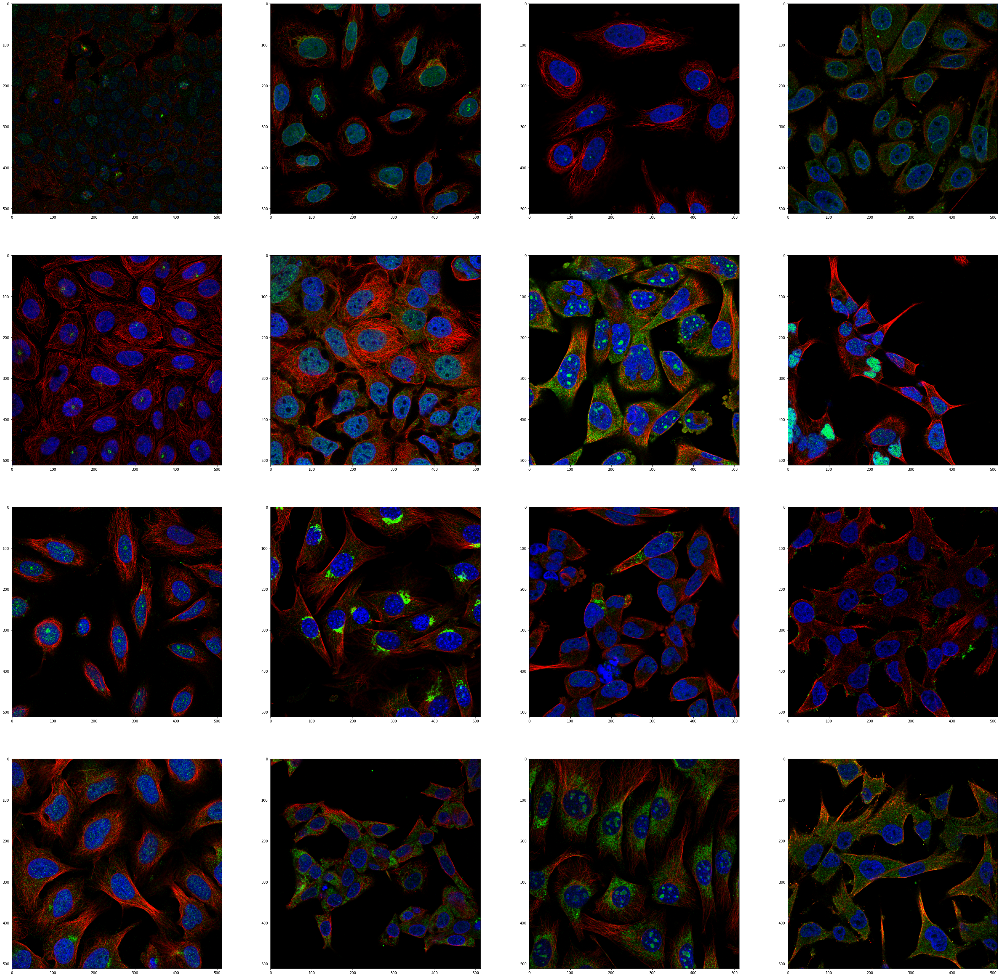

In [17]:
# read data from DB
im, lbl = tg[0]

fig, ax = plt.subplots(4, 4, figsize=(50,50))

for row in range(4):
    for col in range(4):
        ax[row, col].imshow(im[row*4+col, :, :, 0:3])
        #plt.imshow(image[row*4+col, :, :, 0:3]) # first three channels are RGB, fourth is yellow

plt.show()
del(tg, tg_cache)

# Using in Keras
Let's try to test the multi_processing.

In [18]:
#import tensorflow.keras as keras




from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, Input, Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras import metrics
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
#import keras
#import tensorflow as tf

#from tensorflow import set_random_seed
tf.random.set_seed(SEED)
#tf.set_random_seed(SEED)

In [19]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [20]:
#import tensorflow.keras.backend as K

In [21]:

# credits: https://www.kaggle.com/guglielmocamporese/macro-f1-score-keras

def f1(y_true, y_pred):
    #y_pred = K.round(y_pred)
    y_pred = K.cast(y_pred, 'float32')
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(K.greater(K.clip(y_pred, 0, 1), THRESHOLD), 'float32')
    tp = K.sum(y_true*y_pred, axis=0)
    tn = K.sum(K.cast((1-y_true)*(1-y_pred), 'float32'), axis=0)
    fp = K.sum(K.cast((1-y_true)*y_pred, 'float32'), axis=0)
    fn = K.sum(K.cast(y_true*(1-y_pred), 'float32'), axis=0)

    p = K.cast(tp / (tp + fp + K.epsilon()), 'float32')
    r = K.cast(tp / (tp + fn + K.epsilon()), 'float32')

    f1 = K.cast(2*p*r / (p+r+K.epsilon()), 'float32')

    f1 = tf.where(tf.math.is_nan(f1), K.zeros_like(f1), f1)
    #print(K.eval(f1))#, K.zeros_like(f1), f1)))
    #f1 = [np.core.multiarray.where(i) for i in K.rnn(K.math.isnan(f1), K.zeros_like(f1), f1)]
    
    return K.mean(f1)

In [22]:
import numpy as np
from sklearn.metrics import f1_score

# Samples
y_true = np.array([[1.0,1.0,0.0,0.0,1.0], [1.0,0.0,1.0,1.0,0.0], [0.0,1.0,1.0,0.0,0.0]])
y_pred = np.array([[0.0,1.0,1.0,1.0,1.0], [1.0,0.0,0.0,1.0,1.0], [1.0,0.0,1.0,0.0,0.0]])

print('Shape y_true:', y_true.shape)
print('Shape y_pred:', y_pred.shape)

# Results
print('sklearn Macro-F1-Score:', f1_score(y_true, y_pred, average='macro'))
print('Custom Macro-F1-Score:', (f1(y_true, y_pred)).numpy() )

Shape y_true: (3, 5)
Shape y_pred: (3, 5)
sklearn Macro-F1-Score: 0.5999999999999999
Custom Macro-F1-Score: 0.5999999


In [23]:
# some basic useless model
def create_model(input_shape):
    
    model = Sequential()
    model.add(Conv2D(8, (3, 3), activation='relu', input_shape=input_shape))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(16, (3, 3), activation='relu'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, (3, 3), activation='relu'))
    model.add(BatchNormalization(axis=-1))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dropout(0.5))
    #model.add(Dense(28))
    #model.add(Activation('relu'))
    #model.add(Dropout(0.1))
    model.add(Dense(28))
    model.add(Activation('sigmoid'))
    
    return model

In [24]:
import numpy as np

In [25]:
model = create_model((512,512,4))
model.compile(
    loss='binary_crossentropy', 
    optimizer=Adam(0.0001),
    metrics=['acc',f1])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 510, 510, 8)       296       
_________________________________________________________________
batch_normalization (BatchNo (None, 510, 510, 8)       32        
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 255, 255, 8)       0         
_________________________________________________________________
dropout (Dropout)            (None, 255, 255, 8)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 253, 253, 16)      1168      
_________________________________________________________________
batch_normalization_1 (Batch (None, 253, 253, 16)      64        
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 126, 126, 16)      0

In [26]:
DEBUG = True

In [27]:
paths, labels = getTrainDataset()

# divide to 
keys = np.arange(paths.shape[0], dtype=np.int)  
np.random.seed(SEED)
np.random.shuffle(keys)
lastTrainIndex = int((1-VAL_RATIO) * paths.shape[0])

if DEBUG == True:  # use only small subset for debugging, Kaggle's RAM is limited
    pathsTrain = paths[0:256]
    labelsTrain = labels[0:256]
    pathsVal = paths[lastTrainIndex:lastTrainIndex+256]
    labelsVal = labels[lastTrainIndex:lastTrainIndex+256]
    use_cache = True
else:
    pathsTrain = paths[0:lastTrainIndex]
    labelsTrain = labels[0:lastTrainIndex]
    pathsVal = paths[lastTrainIndex:]
    labelsVal = labels[lastTrainIndex:]
    use_cache = True

print(paths.shape, labels.shape)
print(pathsTrain.shape, labelsTrain.shape, pathsVal.shape, labelsVal.shape)

tg = ProteinDataGenerator(pathsTrain, labelsTrain, BATCH_SIZE, SHAPE, use_cache=use_cache)
vg = ProteinDataGenerator(pathsVal, labelsVal, BATCH_SIZE, SHAPE, use_cache=use_cache)

# https://keras.io/callbacks/#modelcheckpoint
checkpoint = ModelCheckpoint('./base.model', monitor='val_f1', verbose=1, save_best_only=True, save_weights_only=False, mode='max', period=1)

(31072,) (31072, 28)
(256,) (256, 28) (256,) (256, 28)


In [28]:
epochs = 50

if DEBUG == True:
    use_multiprocessing = False # DO NOT COMBINE WITH CACHE! 
    workers = 1 # DO NOT COMBINE WITH CACHE! 
else:
    use_multiprocessing = True
    workers = 2

hist = model.fit(
    tg,
    steps_per_epoch=len(tg),
    validation_data=vg,
    validation_steps=8,
    epochs=epochs,
    use_multiprocessing=use_multiprocessing, # you have to train the model on GPU in order to this to be benefitial
    workers=workers, # you have to train the model on GPU in order to this to be benefitial
    verbose=1,
    callbacks=[checkpoint])

Epoch 1/50
16/16 [==============================] - 21s 1s/step - loss: 0.8673 - acc: 0.0582 - f1: 0.0874 - val_loss: 0.8803 - val_acc: 0.0000e+00 - val_f1: 0.0988

Epoch 00001: val_f1 improved from -inf to 0.09885, saving model to ./base.model
INFO:tensorflow:Assets written to: ./base.model/assets
Epoch 2/50
16/16 [==============================] - 17s 1s/step - loss: 0.3776 - acc: 0.1716 - f1: 0.0659 - val_loss: 1.0373 - val_acc: 0.0000e+00 - val_f1: 0.0988

Epoch 00002: val_f1 did not improve from 0.09885
Epoch 3/50
16/16 [==============================] - 17s 1s/step - loss: 0.3447 - acc: 0.1800 - f1: 0.0753 - val_loss: 1.0460 - val_acc: 0.0000e+00 - val_f1: 0.0988

Epoch 00003: val_f1 did not improve from 0.09885
Epoch 4/50
16/16 [==============================] - 17s 1s/step - loss: 0.3317 - acc: 0.1658 - f1: 0.0849 - val_loss: 1.0388 - val_acc: 0.0000e+00 - val_f1: 0.0988

Epoch 00004: val_f1 did not improve from 0.09885
Epoch 5/50
16/16 [==============================] - 16s 1s

16/16 [==============================] - 16s 1s/step - loss: 0.1415 - acc: 0.4368 - f1: 0.2086 - val_loss: 0.3229 - val_acc: 0.3438 - val_f1: 0.0875

Epoch 00039: val_f1 did not improve from 0.09899
Epoch 40/50
16/16 [==============================] - 16s 1s/step - loss: 0.1585 - acc: 0.3595 - f1: 0.2198 - val_loss: 0.3101 - val_acc: 0.3047 - val_f1: 0.0921

Epoch 00040: val_f1 did not improve from 0.09899
Epoch 41/50
16/16 [==============================] - 16s 1s/step - loss: 0.1279 - acc: 0.4511 - f1: 0.2259 - val_loss: 0.3113 - val_acc: 0.3359 - val_f1: 0.0929

Epoch 00041: val_f1 did not improve from 0.09899
Epoch 42/50
16/16 [==============================] - 16s 1s/step - loss: 0.1447 - acc: 0.3919 - f1: 0.2171 - val_loss: 0.3234 - val_acc: 0.3438 - val_f1: 0.0930

Epoch 00042: val_f1 did not improve from 0.09899
Epoch 43/50
16/16 [==============================] - 16s 1s/step - loss: 0.1427 - acc: 0.5142 - f1: 0.2076 - val_loss: 0.3291 - val_acc: 0.3203 - val_f1: 0.0928

Epoch 

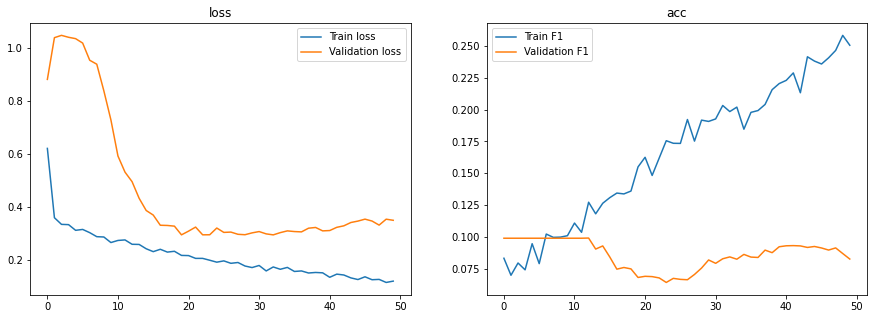

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))
ax[0].set_title('loss')
ax[0].plot(hist.epoch, hist.history["loss"], label="Train loss")
ax[0].plot(hist.epoch, hist.history["val_loss"], label="Validation loss")
ax[1].set_title('acc')
ax[1].plot(hist.epoch, hist.history["f1"], label="Train F1")
ax[1].plot(hist.epoch, hist.history["val_f1"], label="Validation F1")
ax[0].legend()
ax[1].legend()

In [31]:
#fullValGen = ProteinDataGenerator(paths[lastTrainIndex:], labels[lastTrainIndex:], BATCH_SIZE, SHAPE)
#fullValPred = np.zeros((paths[lastTrainIndex:].shape[0], 28))
#for i in tqdm(range(len(fullValGen))):
bestModel = load_model('./base.model', custom_objects={'f1': f1})

In [32]:
pathsTest, labelsTest = getTestDataset()

testg = ProteinDataGenerator(pathsTest, labelsTest, BATCH_SIZE, SHAPE)
submit = pd.read_csv(DIR + '/sample_submission.csv')
P = np.zeros((pathsTest.shape[0], 28))
for i in tqdm(range(len(testg))):
    images, labels = testg[i]
    score = bestModel.predict(images)
    P[i*BATCH_SIZE:i*BATCH_SIZE+score.shape[0]] = score

100%|██████████| 732/732 [06:22<00:00,  1.91it/s]


In [33]:
PP = np.array(P)

In [34]:
prediction = []

for row in tqdm(range(submit.shape[0])):
    
    str_label = ''
    
    for col in range(PP.shape[1]):
        if(PP[row, col] < THRESHOLD):   # to account for losing TP is more costly than decreasing FP
            #print(PP[row])
            str_label += ''
        else:
            str_label += str(col) + ' '
    prediction.append(str_label.strip())
    
submit['Predicted'] = np.array(prediction)
submit.to_csv('datagenerator_model_v1.csv', index=False)

100%|██████████| 11702/11702 [00:00<00:00, 70558.07it/s]
